# Visualization Variant Painting Images and Cells

In [1]:
import os
import glob
import polars as pl
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.io import imread
from tqdm import tqdm
import re
import sys
import subprocess
from plot_utils import *

sys.path.append("../../../2_analyses/1_snakemake_pipeline/2025_varchamp_snakemake/1.image_preprocess_qc/scripts/")
from img_utils import *
# %matplotlib inline

PLATEMAP_DIR = "../../../1_inputs/1_snakemake_pipeline/inputs/metadata/platemaps/{batch_id}/platemap"
TIFF_IMGS_DIR = "../../../2_analyses/1_snakemake_pipeline/2025_varchamp_snakemake/1.image_preprocess_qc/inputs/cpg_imgs"

## 1. Loading meta data and variant classification

In [2]:
BIO_REP_BATCHES = ["2025_01_27_Batch_13", "2025_01_28_Batch_14"]
COMBINED_BIO_REP_DIR = "2025_01_Batch_13-14"

IMG_QC_DIR = f"../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/1.image_qc_outputs/{COMBINED_BIO_REP_DIR}"
SUM_STATS_DIR = f"../../../3_outputs/1_snakemake_pipeline/3.smp_results_analyses/3.classification_analyses/{COMBINED_BIO_REP_DIR}"

### 1.1 Read in the meta data

In [7]:
allele_meta_dict = {}
for batch_id in BIO_REP_BATCHES:
    allele_meta_df = pl.DataFrame()
    for platemap in os.listdir(PLATEMAP_DIR.format(batch_id=batch_id)):
        if "ipy" in platemap:
            continue
        platemap_df = pl.read_csv(os.path.join(PLATEMAP_DIR.format(batch_id=batch_id), platemap), separator="\t", infer_schema_length=100000)
        allele_meta_df = pl.concat([allele_meta_df, 
                                    platemap_df.filter((pl.col("node_type").is_not_null()))], # (~pl.col("node_type").is_in(["TC","NC","PC"]))&
                                    how="diagonal_relaxed").sort("plate_map_name")
        allele_meta_df = allele_meta_df.with_columns(pl.col("plate_map_name").str.split('_').list.get(0).alias("plate_map"))
    allele_meta_dict[batch_id] = allele_meta_df

In [8]:
local_wtvar = pl.read_csv(f"{SUM_STATS_DIR}/altered_GFP_summary_auroc.csv")
morph_wtvar = pl.read_csv(f"{SUM_STATS_DIR}/altered_Morph_summary_auroc.csv")

In [9]:
img_well_qc_sum = pl.read_csv(f"{IMG_QC_DIR}/plate-well-level_img_qc_sum.csv")
img_well_qc_sum

plate,well,channel,mean,std,perc_25,perc_50,perc_75,perc_80,perc_90,perc_95,perc_99,mean_plate,std_plate,perc_25_plate,median_plate,perc_75_plate,perc_80_plate,perc_90_plate,perc_95_plate,perc_99_plate,s2n_ratio,s2n_threshold,is_bg,plate_id,plate_well,plate_map_name,well_position,symbol,gene_allele,imaging_well,imaging_plate_R1,imaging_plate_R2,node_type,orf_id_wt,ccsb_mutation_id,nt_change_cdna,aa_change,allele_set,imaging_plate,batch1,batch2,clone_ID,hgmd_ID,clinvar_allele_ID,clinvar_clinical_significance,vector,notes,quad,c96,r96,r384,c384,r384_letter
str,str,str,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,i64,i64,i64,i64,i64,i64,i64,f64,f64,bool,str,str,str,str,str,str,str,str,str,str,f64,str,str,str,f64,f64,f64,f64,str,str,str,str,f64,str,i64,i64,i64,i64,i64,str
"""2025_01_27_B13A7A8P1_T1""","""N04""","""DAPI""",186.658258,49.354519,166,188,207,211,220,227,239,212.055204,170.150171,167,189,210,215,228,248,1005,1.439759,1.587511,true,"""B13A7A8P1""","""B13A7A8P1-N04""","""B13A7A8P1_R1""","""N04""","""MSH2""","""MSH2_His46Gln""","""N04""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7918.0,"""CCSBVarC010836""","""138C>G""","""His46Gln""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,2,7,14,4,"""N"""
"""2025_01_27_B13A7A8P1_T1""","""E06""","""DAPI""",185.199642,38.921973,165,186,206,210,220,226,238,212.055204,170.150171,167,189,210,215,228,248,1005,1.442424,1.587511,true,"""B13A7A8P1""","""B13A7A8P1-E06""","""B13A7A8P1_R1""","""E06""","""eGFP""","""eGFP""","""E06""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""TC""",null,null,null,null,7.0,1.0,13.0,14.0,null,null,null,null,561.0,null,2,3,3,5,6,"""E"""
"""2025_01_27_B13A7A8P1_T1""","""A16""","""DAPI""",188.93873,60.094691,167,188,207,210,220,226,241,212.055204,170.150171,167,189,210,215,228,248,1005,1.443114,1.587511,true,"""B13A7A8P1""","""B13A7A8P1-A16""","""B13A7A8P1_R1""","""A16""","""F9""","""F9_Cys178Phe""","""A16""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",52861.0,"""CCSBVarC030553""","""533G>T""","""Cys178Phe""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,2,8,1,1,16,"""A"""
"""2025_01_27_B13A7A8P1_T1""","""H06""","""DAPI""",188.812683,48.775342,168,190,210,214,223,230,243,212.055204,170.150171,167,189,210,215,228,248,1005,1.446429,1.587511,true,"""B13A7A8P1""","""B13A7A8P1-H06""","""B13A7A8P1_R1""","""H06""","""MSH2""","""MSH2_Leu187Arg""","""H06""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",7918.0,"""CCSBVarC010860""","""560T>G""","""Leu187Arg""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,4,3,4,8,6,"""H"""
"""2025_01_27_B13A7A8P1_T1""","""A09""","""DAPI""",188.448448,63.74331,167,188,207,211,221,228,242,212.055204,170.150171,167,189,210,215,228,248,1005,1.449102,1.587511,true,"""B13A7A8P1""","""B13A7A8P1-A09""","""B13A7A8P1_R1""","""A09""","""BRAF""","""BRAF_Phe595Leu""","""A09""","""B13A7A8P1_R1""","""B14A7A8P1_R2""","""allele""",71969.0,"""CCSBVarC002859""","""1785T>G""","""Phe595Leu""",7.0,1.0,13.0,14.0,null,null,null,null,527.0,null,1,5,1,1,9,"""A"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""2025_01_28_B14A7A8P2_T4""","""G07""","""Mito""",957.72281,1075.976928,446,548,936,1224,2237,3173,5493,852.191422,932.470109,478,572,699,857,1705,2624,4783,12.316143,1.756779,false,"""B14A7A8P2""","""B14A7A8P2-G07""","""B14A7A8P2_R2""","""G07""","""ALK""","""ALK""","""G07""","""B13A7A8P2_R1""","""B14A7A8P2_R2""","""PC""",null,""" """,null,null,7.0,2.0,13.0,14.0,null,null,null,null,527.0,null,1,4,4,7,7,"""G"""
"""2025_01_28_B14A7A8P2_T4""","""I11""","""Mito""",902.209848,1906.543146,456,539,624,687,1714,2792,5667,852.191422,932.470109,478,572,699,857,1705,2624,4783,12.427632,1.756779,false,"""B14A7A8P2""","""B14A7A8P2-I11""","""B14A7A8P2_R2""","""I11""","""RAF1""","""RAF1_Pro261Ser""","""I11""","""B13A7A8P2_R1""","""B14A7A8P2_R2""","""allele""",732.0,"""CCSBVarC008859""","""781C>T""","""Pro261Ser""",7.0,2.0,13.0,14.0,null,null,null,null,527.0,null,1,6,5,9,11,"""I"""
"""2025_

## 2. Plot Variant Painting Well Images

In [10]:
OUT_IMG_DIR = f"../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/visualize_imgs/{COMBINED_BIO_REP_DIR}"
# if not os.path.exists(out_imgs_dir):
#     os.makedirs(out_imgs_dir)

<Figure size 640x480 with 0 Axes>

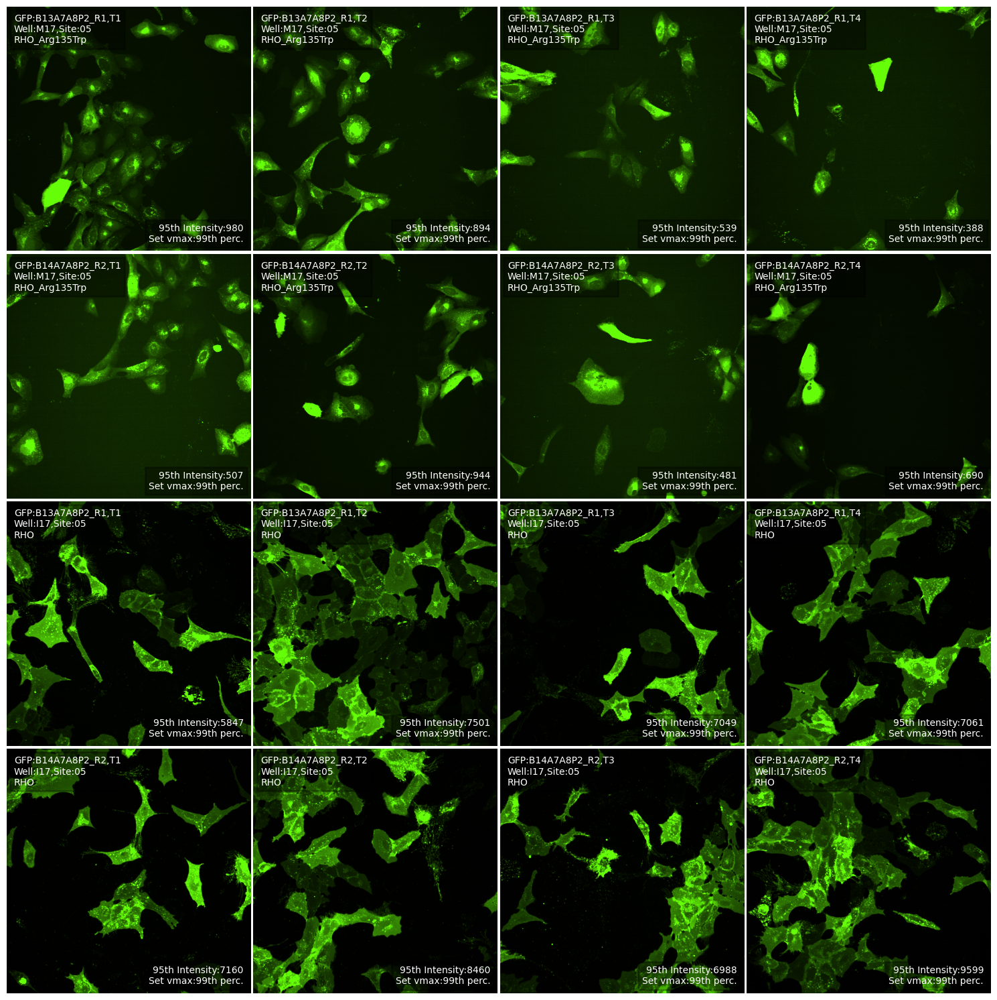

In [9]:
plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
            "RHO_Arg135Trp", "GFP", auroc_df=local_wtvar, plate_img_qc=img_well_qc_sum, 
            site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_IMG_DIR)

<Figure size 640x480 with 0 Axes>

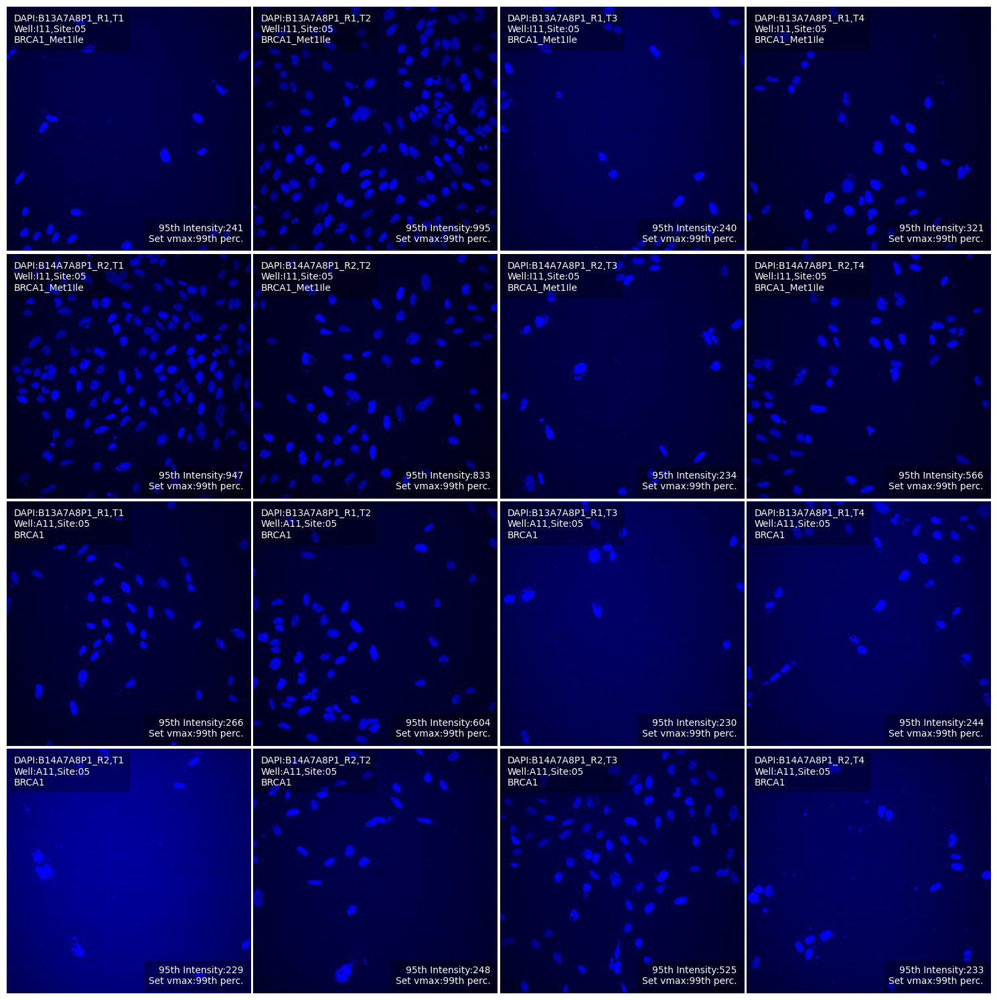

In [12]:
plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
            "BRCA1_Met1Ile", "DAPI", auroc_df=local_wtvar, plate_img_qc=img_well_qc_sum, 
            site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_IMG_DIR)

<Figure size 640x480 with 0 Axes>

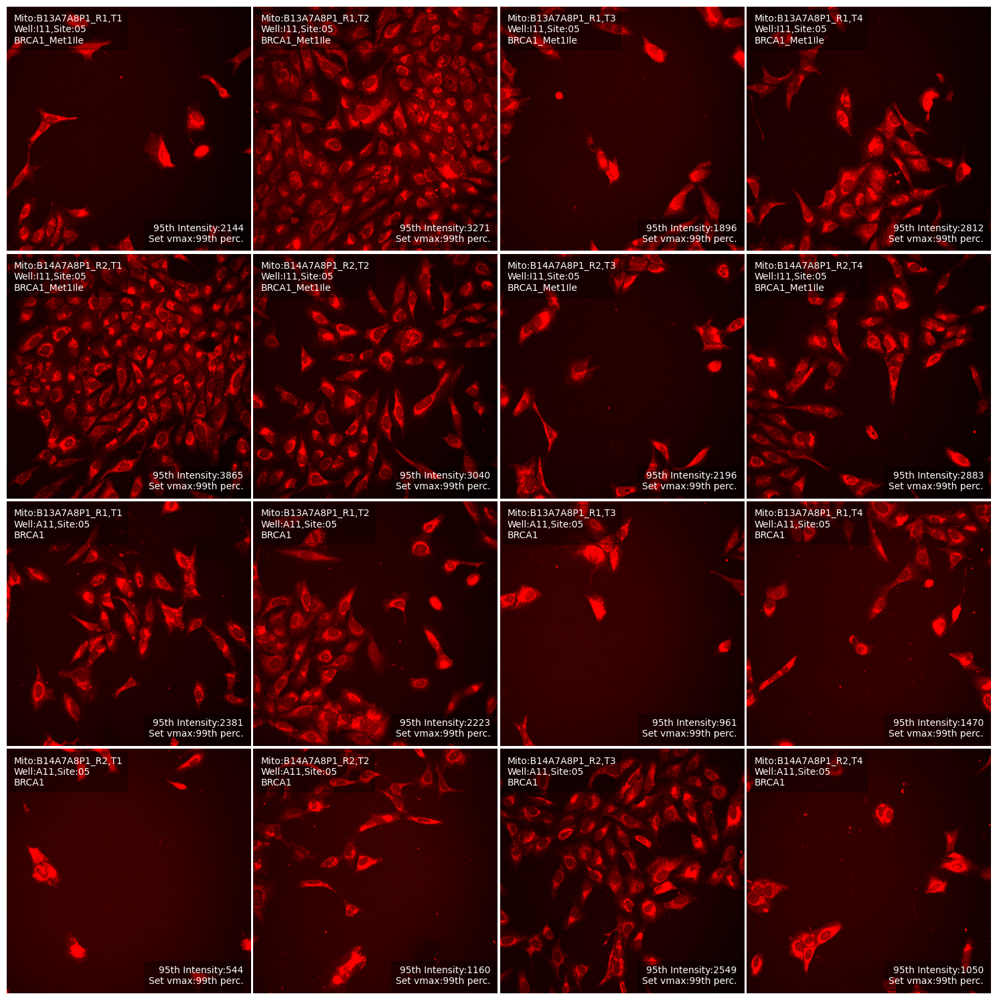

In [13]:
plot_allele(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
            "BRCA1_Met1Ile", "Mito", auroc_df=local_wtvar, plate_img_qc=img_well_qc_sum, 
            site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_IMG_DIR)

### 2.1 Output specific mislocalized alleles for investigation

In [14]:
# for allele in tqdm(local_wtvar.filter((pl.col("Altered_local_both_batches")))["allele_0"]):
#     print(allele)
#     try:
#         plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "GFP", auroc_df=local_wtvar, plate_img_qc=plate_img_qc, 
#                     site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#         print(allele)
#     except:
#         print(allele, "Failed")
#         continue

# for allele in tqdm(morph_wtvar.filter((pl.col("Altered_morph_both_batches")))["allele_0"]):
#     # print(allele)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "AGP", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "Mito", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)
#     plot_allele(meta_data.filter(pl.col("plate_map_name").str.contains("B13")), allele, "DAPI", auroc_df=morph_wtvar, plate_img_qc=plate_img_qc, site="05", max_intensity=0.99, display=False, output_dir=out_imgs_dir)

## 3. Plot Cells

In [15]:
OUT_CELLS_DIR = f"../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/visualize_cells/{COMBINED_BIO_REP_DIR}"
BATCH_PROFILES = "../../../3_outputs/1_snakemake_pipeline/2.sm_pipeline_outputs/batch_profiles/{}/profiles.parquet"
IMG_ANALYSIS_DIR = "../../../1_inputs/1_snakemake_pipeline/cpg_imgs/{}/analysis"

In [16]:
# Filter thresholds
min_area_ratio = 0.15
max_area_ratio = 0.3
min_center = 50
max_center = 1030
num_mad = 5
min_cells = 250

batch_profiles = {}
for batch_id in BIO_REP_BATCHES:
    imagecsv_dir = IMG_ANALYSIS_DIR.format(batch_id) #f"../../../8.1_upstream_analysis_runxi/2.raw_img_qc/inputs/images/{batch_id}/analysis"
    prof_path = BATCH_PROFILES.format(batch_id)
    
    # Get metadata
    profiles = pl.scan_parquet(prof_path).select(
        ["Metadata_well_position", "Metadata_plate_map_name", "Metadata_ImageNumber", "Metadata_ObjectNumber",
        "Metadata_symbol", "Metadata_gene_allele", "Metadata_node_type", "Metadata_Plate",
        "Nuclei_AreaShape_Area", "Cells_AreaShape_Area", "Nuclei_AreaShape_Center_X", "Nuclei_AreaShape_Center_Y",
        "Cells_AreaShape_BoundingBoxMaximum_X", "Cells_AreaShape_BoundingBoxMaximum_Y", "Cells_AreaShape_BoundingBoxMinimum_X",
        "Cells_AreaShape_BoundingBoxMinimum_Y",	"Cells_AreaShape_Center_X",	"Cells_AreaShape_Center_Y",
        "Cells_Intensity_MeanIntensity_GFP", "Cells_Intensity_MedianIntensity_GFP", "Cells_Intensity_IntegratedIntensity_GFP"],
    ).collect()
    # print(profiles["Metadata_Plate"])
    # break

    # Filter based on cell to nucleus area
    profiles = profiles.with_columns(
                    (pl.col("Nuclei_AreaShape_Area")/pl.col("Cells_AreaShape_Area")).alias("Nucleus_Cell_Area"),
                    pl.concat_str([
                        "Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber", "Metadata_ObjectNumber",
                        ], separator="_").alias("Metadata_CellID"),
            ).filter((pl.col("Nucleus_Cell_Area") > min_area_ratio) & (pl.col("Nucleus_Cell_Area") < max_area_ratio))

    # Filter cells too close to image edge
    profiles = profiles.filter(
        ((pl.col("Nuclei_AreaShape_Center_X") > min_center) & (pl.col("Nuclei_AreaShape_Center_X") < max_center) &
        (pl.col("Nuclei_AreaShape_Center_Y") > min_center) & (pl.col("Nuclei_AreaShape_Center_Y") < max_center)),
    )

    # Calculate mean, median and mad of gfp intensity for each allele
    ## mean
    means = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Cells_Intensity_MeanIntensity_GFP").mean().alias("WellIntensityMean"),
    )
    profiles = profiles.join(means, on=["Metadata_Plate", "Metadata_well_position"])
    ## median
    medians = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Cells_Intensity_MedianIntensity_GFP").median().alias("WellIntensityMedian"),
    )
    profiles = profiles.join(medians, on=["Metadata_Plate", "Metadata_well_position"])
    ## mad
    profiles = profiles.with_columns(
        (pl.col("Cells_Intensity_MedianIntensity_GFP") - pl.col("WellIntensityMedian")).abs().alias("Abs_dev"),
    )
    mad = profiles.group_by(["Metadata_Plate", "Metadata_well_position"]).agg(
        pl.col("Abs_dev").median().alias("Intensity_MAD"),
    )
    profiles = profiles.join(mad, on=["Metadata_Plate", "Metadata_well_position"])

    # Threshold is 5X
    # Used to be median well intensity + 5*mad implemented by Jess
    # Switching to mean well intensity + 5*mad implemented by Runxi
    # profiles = profiles.with_columns(
    #     (pl.col("WellIntensityMedian") + num_mad*pl.col("Intensity_MAD")).alias("Intensity_upper_threshold"), ## pl.col("WellIntensityMedian")
    #     (pl.col("WellIntensityMedian") - num_mad*pl.col("Intensity_MAD")).alias("Intensity_lower_threshold"), ## pl.col("WellIntensityMedian")
    # )
    # ## Filter by intensity MAD
    # profiles = profiles.filter(
    #     pl.col("Cells_Intensity_MeanIntensity_GFP") <= pl.col("Intensity_upper_threshold"),
    # ).filter(
    #     pl.col("Cells_Intensity_MeanIntensity_GFP") >= pl.col("Intensity_lower_threshold"),
    # )

    # Filter out alleles with fewer than 250 cells
    # keep_alleles = profiles.group_by("Metadata_gene_allele").count().filter(
    #     pl.col("count") >= min_cells,
    #     ).select("Metadata_gene_allele").to_series().to_list()
    # profiles = profiles.filter(pl.col("Metadata_gene_allele").is_in(keep_alleles))

    # add full crop coordinates
    profiles = profiles.with_columns(
        (pl.col("Nuclei_AreaShape_Center_X") - 50).alias("x_low").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_X") + 50).alias("x_high").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_Y") - 50).alias("y_low").round().cast(pl.Int16),
        (pl.col("Nuclei_AreaShape_Center_Y") + 50).alias("y_high").round().cast(pl.Int16),
    )

    # Read in all Image.csv to get ImageNumber:SiteNumber mapping and paths
    image_dat = []
    icfs = glob.glob(os.path.join(imagecsv_dir, "**/*Image.csv"), recursive=True)
    for icf in tqdm(icfs):
        fp = icf.split('/')[-2]
        # print(fp)
        plate, well = "-".join(fp.split("-")[:-2]), fp.split("-")[-2]
        # print(plate, well)
        image_dat.append(pl.read_csv(icf).select(
            [
                "ImageNumber",
                "Metadata_Site",
                "PathName_OrigDNA",
                "FileName_OrigDNA",
                "FileName_OrigGFP",
                ],
            ).with_columns(
            pl.lit(plate).alias("Metadata_Plate"),
            pl.lit(well).alias("Metadata_well_position"),
            ))
    image_dat = pl.concat(image_dat).rename({"ImageNumber": "Metadata_ImageNumber"})

    # Create useful filepaths
    image_dat = image_dat.with_columns(
        pl.col("PathName_OrigDNA").str.replace(".*cpg0020-varchamp/", "").alias("Path_root"),
    )

    image_dat = image_dat.drop([
        "PathName_OrigDNA",
        "FileName_OrigDNA",
        "FileName_OrigGFP",
        "Path_root",
    ])
    # print(image_dat)

    # Append to profiles
    profiles = profiles.join(image_dat, on = ["Metadata_Plate", "Metadata_well_position", "Metadata_ImageNumber"])

    # Sort by allele, then image number
    profiles = profiles.with_columns(
        pl.concat_str(["Metadata_Plate", "Metadata_well_position", "Metadata_Site"], separator="_").alias("Metadata_SiteID"),
        pl.col("Metadata_gene_allele").str.replace("_", "-").alias("Protein_label"),
    )
    profiles = profiles.sort(["Protein_label", "Metadata_SiteID"])
    alleles = profiles.select("Protein_label").to_series().unique().to_list()

    batch_profiles[batch_id] = profiles

100%|██████████| 27647/27647 [00:58<00:00, 476.17it/s]


In [17]:
def crop_allele(allele: str, profile_df: pl.DataFrame, meta_plate: str, rep: str, site: str="5") -> None:
    """Crop images and save metadata as numpy arrays for one allele.

    Parameters
    ----------
    allele : String
        Name of allele to process
    profile_df : String
        Dataframe with pathname and cell coordinates
    img_dir : String
        Directory where all images are stored
    out_dir : String
        Directory where numpy arrays should be saved
    """
    allele_df = profile_df.filter(
        (pl.col("Metadata_gene_allele")==allele) &
        (pl.col("Metadata_Site")==int(site)) &
        (pl.col("Metadata_plate_map_name").str.contains(meta_plate)) &
        (pl.col("Metadata_Plate").str.contains(rep))
    )
    return allele_df

allele_df = crop_allele("RHO_Arg135Trp", batch_profiles["2025_01_27_Batch_13"], "B13A7A8", "T4", site="5")
allele_df

Metadata_well_position,Metadata_plate_map_name,Metadata_ImageNumber,Metadata_ObjectNumber,Metadata_symbol,Metadata_gene_allele,Metadata_node_type,Metadata_Plate,Nuclei_AreaShape_Area,Cells_AreaShape_Area,Nuclei_AreaShape_Center_X,Nuclei_AreaShape_Center_Y,Cells_AreaShape_BoundingBoxMaximum_X,Cells_AreaShape_BoundingBoxMaximum_Y,Cells_AreaShape_BoundingBoxMinimum_X,Cells_AreaShape_BoundingBoxMinimum_Y,Cells_AreaShape_Center_X,Cells_AreaShape_Center_Y,Cells_Intensity_MeanIntensity_GFP,Cells_Intensity_MedianIntensity_GFP,Cells_Intensity_IntegratedIntensity_GFP,Nucleus_Cell_Area,Metadata_CellID,WellIntensityMean,WellIntensityMedian,Abs_dev,Intensity_MAD,x_low,x_high,y_low,y_high,Metadata_Site,Metadata_SiteID,Protein_label
str,str,i64,i64,str,str,str,str,i64,i64,f64,f64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,str,f64,f64,f64,f64,i16,i16,i16,i16,i64,str,str
"""M17""","""B13A7A8P2_R1""",2741,8,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",2324,9344,184.127797,586.710413,227,667,106,504,173.967145,579.225171,0.003404,0.002994,31.805561,0.248716,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.00141,0.00163,134,234,537,637,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,10,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1332,7495,324.037538,790.998498,377,847,289,717,330.453502,780.218946,0.006596,0.006197,49.434973,0.177718,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.001793,0.00163,274,374,741,841,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,11,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1588,8115,910.258816,903.959068,962,965,867,809,913.279729,901.67061,0.005252,0.004208,42.619208,0.195687,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.000196,0.00163,860,960,854,954,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,3,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1181,7045,145.50127,242.008467,192,281,110,170,150.305749,224.446842,0.007157,0.005005,50.42145,0.167637,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.000601,0.00163,96,196,192,292,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,2,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",1346,8450,75.673848,233.344725,151,322,0,145,71.541302,221.958107,0.00978,0.008835,82.642672,0.15929,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.004431,0.00163,26,126,183,283,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""
"""M17""","""B13A7A8P2_R1""",2741,4,"""RHO""","""RHO_Arg135Trp""","""allele""","""2025_01_27_B13A7A8P2_T4""",2234,8703,587.649508,295.193823,646,378,538,228,592.60301,292.785706,0.018068,0.016386,157.248497,0.256693,"""2025_01_27_B13A7A8P2_T4_M17_27…",0.006145,0.004404,0.011982,0.00163,538,638,245,345,5,"""2025_01_27_B13A7A8P2_T4_M17_5""","""RHO-Arg135Trp"""


In [18]:
# Compute distances from edges and find the most centered well
def compute_distance_cell(row, col, edge=1080):
    return min(row - 1, edge - row, col - 1, edge - col)  # Distance from nearest edge
    
# ## Define mapping between simple names and folder names
# batch_dict = {
#     "B7A1R1": "2024_01_23_Batch_7",
#     "B7A2R1": "2024_01_23_Batch_7",
#     "B8A1R2": "2024_02_06_Batch_8",
#     "B8A2R2": "2024_02_06_Batch_8",
#     "B13A7A8P1": "2025_01_27_Batch_13",
#     "B13A7A8P2": "2025_01_27_Batch_13",
#     "B14A7A8P1": "2025_01_28_Batch_14",
#     "B14A7A8P2": "2025_01_28_Batch_14",
#     "B15A1A2P1": "2025_03_17_Batch_15",
#     "B16A1A2P1": "2025_03_17_Batch_16",
# }

def plot_allele_cell(pm, variant, sel_channel, auroc_df, site="05", max_intensity=0.99, display=False, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR):
    cmap = channel_to_cmap(sel_channel)
    channel = channel_dict[sel_channel]
    auroc = auroc_df.filter(pl.col("allele_0")==variant)["AUROC_Mean"].mean()

    # if os.path.exists(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png")):
    #     print(f"Image for {variant} already exists.")
        # return None

    ## get the number of wells/images per allele
    wt = variant.split("_")[0]
    wt_wells = pm.filter(pl.col("gene_allele") == wt).select("imaging_well").to_pandas().values.flatten()
    var_wells = pm.filter(pl.col("gene_allele") == variant).select("imaging_well").to_pandas().values.flatten()
    plate_map = pm.filter(pl.col("gene_allele") == variant).select("plate_map_name").to_pandas().values.flatten()

    if len(wt_wells) > 1:
        # Get coordinates of wells
        well_coords = [well_to_coordinates(w) for w in set([ref_well_pl for ref_well_pl in wt_wells])]
        # Sort wells by max distance from edges (descending)
        wt_wells = [max(well_coords, key=lambda x: compute_distance(x[1], x[2]))[0]]

    pm_var = pm.filter((pl.col("imaging_well").is_in(np.concatenate([wt_wells, var_wells])))&(pl.col("plate_map_name").is_in(plate_map))).sort("node_type")
    # print(pm_var)
    plt.clf()

    fig, axes = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    # fig2, axes2 = plt.subplots((len(wt_wells)+len(var_wells))*2, 4, figsize=(15, 16), sharex=True, sharey=True)
    for wt_var, pm_row in enumerate(pm_var.iter_rows(named=True)):
        # print(pm_row)
        if pm_row["node_type"] == "allele":
            well = var_wells[0]
            allele = variant
        else:
            well = wt_wells[0]
            allele = wt

        for i in range(8):
            plot_idx = i+wt_var*4*2
            if i < 4:
                sel_plate = pm_row["imaging_plate_R1"]
            else:
                sel_plate = pm_row["imaging_plate_R2"]
                
            batch = batch_dict[sel_plate.split("_")[0]]
            batch_img_dir = f'{imgs_dir}/{batch}/images'
            letter = well[0]
            row = letter_dict[letter]
            col = well[1:3]
            
            # print(i, allele, well)
            plate_img_dir = plate_dict[sel_plate][f"T{i%4+1}"]
            img_file = f"r{row}c{col}f{site}p01-ch{channel}sk1fk1fl1.tiff"
            img = imread(f"{batch_img_dir}/{plate_img_dir}/Images/{img_file}", as_gray=True)
            # print(np.percentile(img, 99) / np.median(img), np.percentile(img, 99) / np.percentile(img, 25))

            ## Full images
            # axes2.flatten()[plot_idx].imshow(img, vmin=0, vmax=np.percentile(img, max_intensity*100), cmap=cmap)
            # plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
            # axes2.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
            #         verticalalignment='top', horizontalalignment='left', transform=axes2.flatten()[plot_idx].transAxes,
            #         bbox=dict(facecolor='black', alpha=0.3, linewidth=2))

            ## Draw cells
            cell_allele_coord_df = crop_allele(allele, batch_profiles[batch], sel_plate.split("P")[0], f"T{i%4+1}", site=site[-1]) # "2024_01_19_B7A1R1_P4T1"
            cell_allele_coord_df = cell_allele_coord_df.with_columns(
                pl.struct("Cells_AreaShape_Center_X", "Cells_AreaShape_Center_Y") # 'Nuclei_AreaShape_Center_X', 'Nuclei_AreaShape_Center_Y'
                .map_elements(lambda x: compute_distance_cell(x['Cells_AreaShape_Center_X'], x['Cells_AreaShape_Center_Y']), return_dtype=pl.Float32).cast(pl.Int16)
                .alias('dist2edge')
            ).sort(by=["dist2edge","Cells_AreaShape_Area"], descending=[True,True]).filter(pl.col("Cells_AreaShape_Area")>5000)
            # print(allele, sel_plate, f"T{i%4+1}", site[-1])
            # print(cell_allele_coord_df.select(pl.col(["dist2edge","Cells_AreaShape_Area","Metadata_ObjectNumber"])))
            # display(cell_allele_coord_df)
            
            if cell_allele_coord_df.is_empty():
                axes.flatten()[plot_idx].set_visible(False)
                # print(i, allele, well)
                continue
            else:
                plot_yet = 0
                for cell_idx, cell_row in enumerate(cell_allele_coord_df.head(10).iter_rows(named=True)):
                    if plot_yet:
                        break
                    x, y = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
                    # x, y = int(cell_allele_coord_df["Cells_AreaShape_Center_X"].to_numpy()[0]), int(cell_allele_coord_df["Cells_AreaShape_Center_Y"].to_numpy()[0])
                    ## flip the x and y for visualization
                    img_sub = img[
                        y-112:y+112, x-112:x+112
                    ]
                    ## skip the subimage due to poor cell quality
                    if img_sub.shape[0] == 0 or img_sub.shape[1] == 0 or np.percentile(img_sub, 90) <= np.median(img) or np.var(img_sub) < 1e4:
                        continue
                    axes.flatten()[plot_idx].imshow(img_sub, vmin=0, vmax=np.percentile(img_sub, max_intensity*100), cmap=cmap)  ## np.percentile(img_sub, max_intensity*100)
                    plot_label = f"{sel_channel}:{sel_plate},T{i%4+1}\nWell:{well},Site:{site}\n{allele}"
                    axes.flatten()[plot_idx].text(0.03, 0.97, plot_label, color='white', fontsize=10,
                            verticalalignment='top', horizontalalignment='left', transform=axes.flatten()[plot_idx].transAxes,
                            bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    int_95 = str(int(round(np.percentile(img_sub, 95))))
                    axes.flatten()[plot_idx].text(0.95, 0.05, f"95th Intensity:{int_95}", color='white', fontsize=10,
                                verticalalignment='bottom', horizontalalignment='right', transform=axes.flatten()[plot_idx].transAxes,
                                bbox=dict(facecolor='black', alpha=0.3, linewidth=2))
                    axes.flatten()[plot_idx].axis("off")
                    plot_yet = 1

                # axes.flatten()[plot_idx].set_visible(False)
                # x_min, y_min, x_max, y_max = int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMinimum_Y"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_X"].to_numpy()[0]), \
                #                              int(cell_allele_coord_df["Cells_AreaShape_BoundingBoxMaximum_Y"].to_numpy()[0])
                # print(x_min, y_min, x_max, y_max)
            #     for cell_idx, cell_row in enumerate(cell_allele_coord_df.head().iter_rows(named=True)):
            #         x_nuc, y_nuc = int(cell_row["Nuclei_AreaShape_Center_X"]), int(cell_row["Nuclei_AreaShape_Center_Y"])
            #         # Create a Rectangle patch
            #         rect = patches.Rectangle((x_nuc-5, y_nuc-5), 10, 10, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         rect = patches.Rectangle((x-128, y-128), 256, 256, linewidth=2, edgecolor='red', facecolor='none')
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         # x_min, y_min, x_max, y_max = int(cell_row["Cells_AreaShape_BoundingBoxMinimum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMinimum_Y"]), \
            #         #                              int(cell_row["Cells_AreaShape_BoundingBoxMaximum_X"]), int(cell_row["Cells_AreaShape_BoundingBoxMaximum_Y"])
            #         # print(x_min, y_min, x_max, y_max)
            #         # rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=2, edgecolor='red', facecolor='none')
            #         # Add the patch to the Axes
            #         axes2.flatten()[plot_idx].add_patch(rect)
            #         break
            # int_95 = str(int(round(np.percentile(img, 95))))
            # axes2.flatten()[plot_idx].axhline(y=img.shape[1]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].axvline(x=img.shape[0]//2, color='red', linestyle='--', linewidth=1)
            # axes2.flatten()[plot_idx].text(0.95, 0.05, f"95th Percentile\nIntensity:{int_95}", color='white', fontsize=12,
            #                verticalalignment='bottom', horizontalalignment='right', transform=axes2.flatten()[plot_idx].transAxes)
            # axes2.flatten()[plot_idx].axis("off")
            
    fig.tight_layout()
    fig.subplots_adjust(wspace=.01, hspace=-0.2, top=.99)
    
    if display:
        plt.show()

    if output_dir:
        fig.savefig(os.path.join(output_dir, f"{variant}_{sel_channel}_{auroc:.3f}_cells.png"), dpi=400, bbox_inches='tight')
        plt.close(fig)

<Figure size 640x480 with 0 Axes>

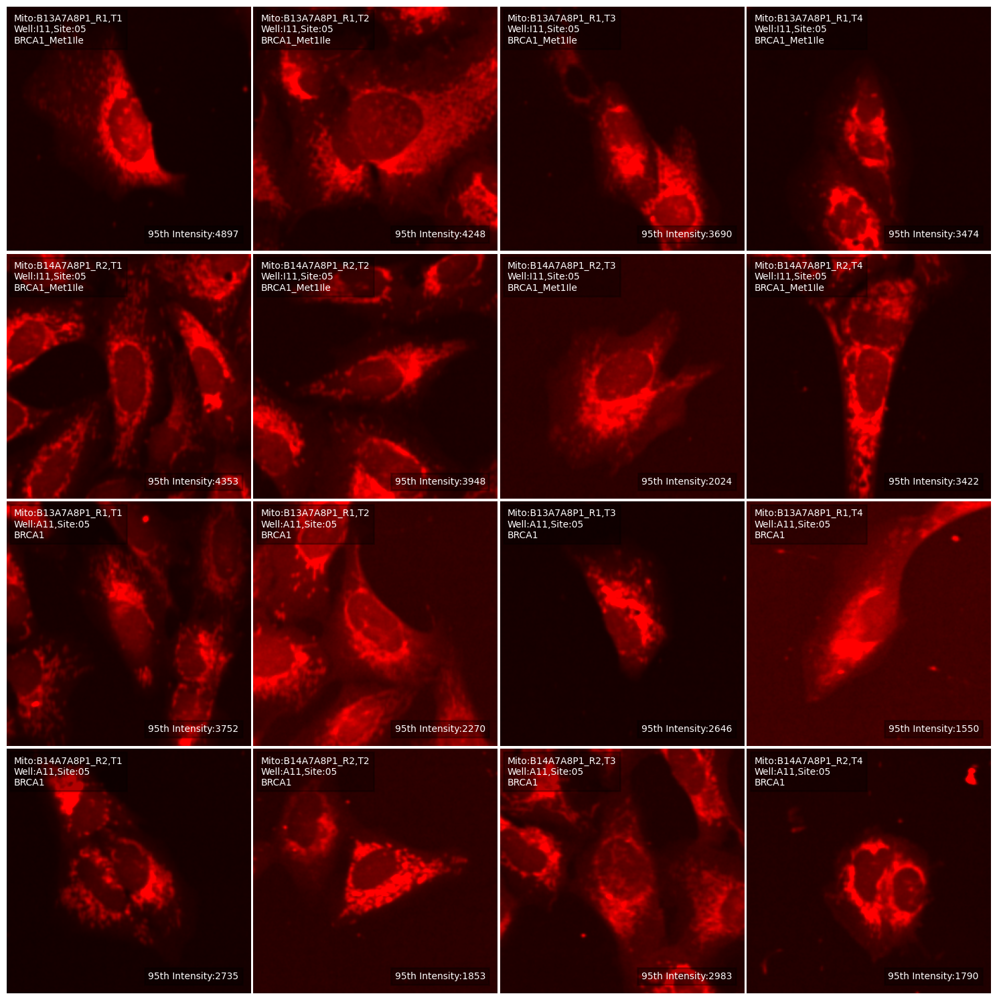

<Figure size 640x480 with 0 Axes>

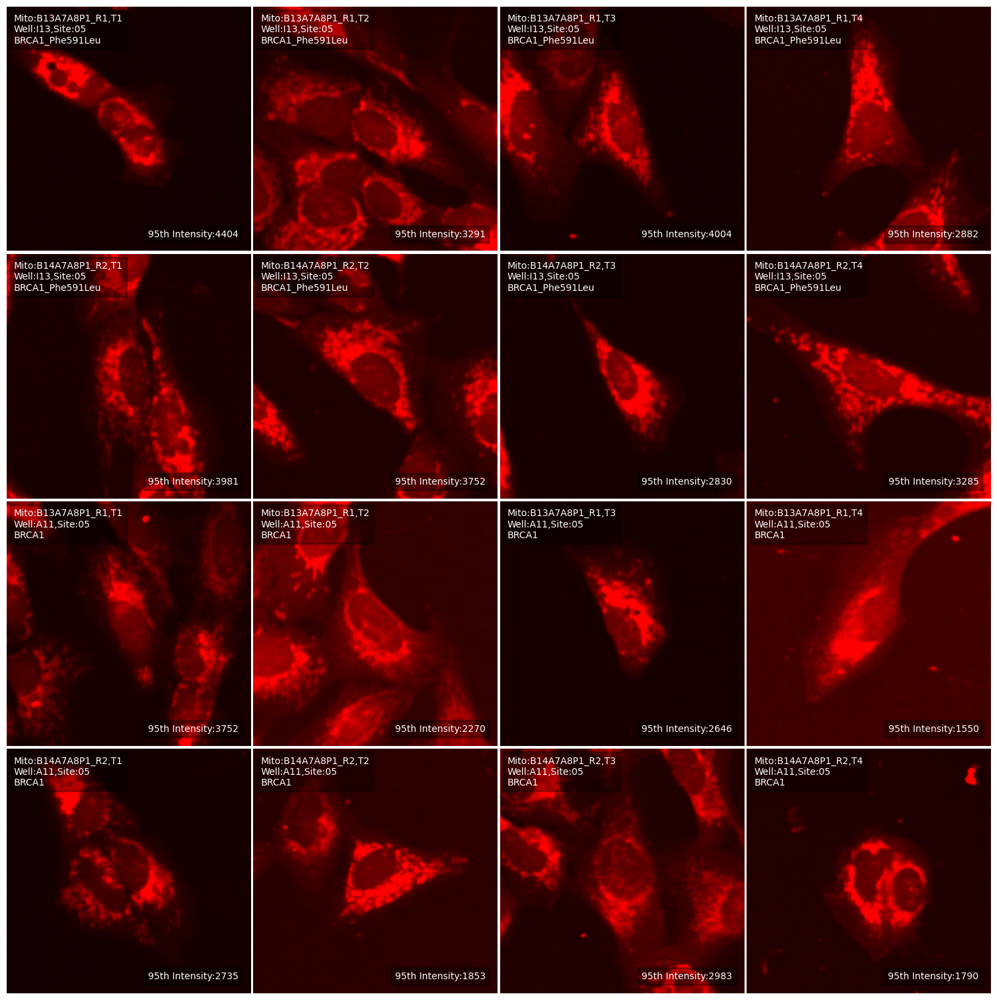

In [19]:
plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "BRCA1_Met1Ile", "Mito", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "BRCA1_Phe591Leu", "Mito", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

<Figure size 640x480 with 0 Axes>

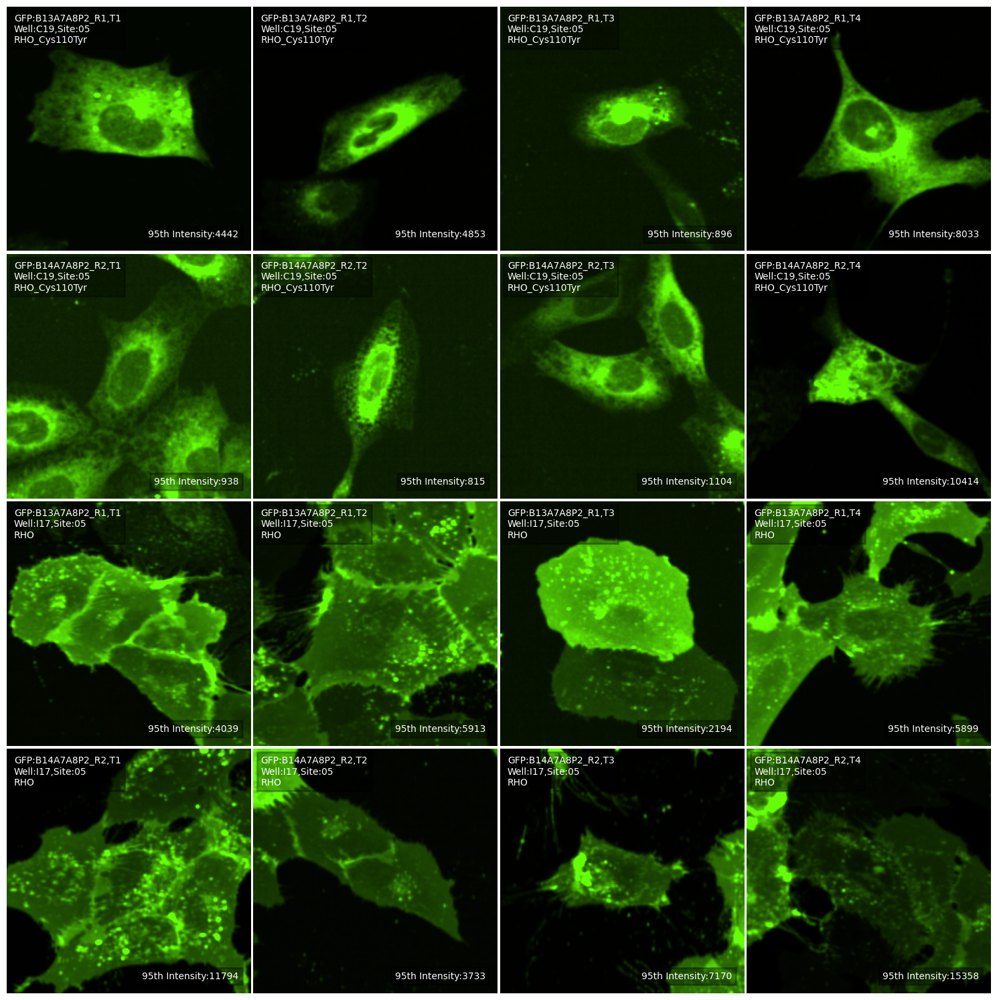

<Figure size 640x480 with 0 Axes>

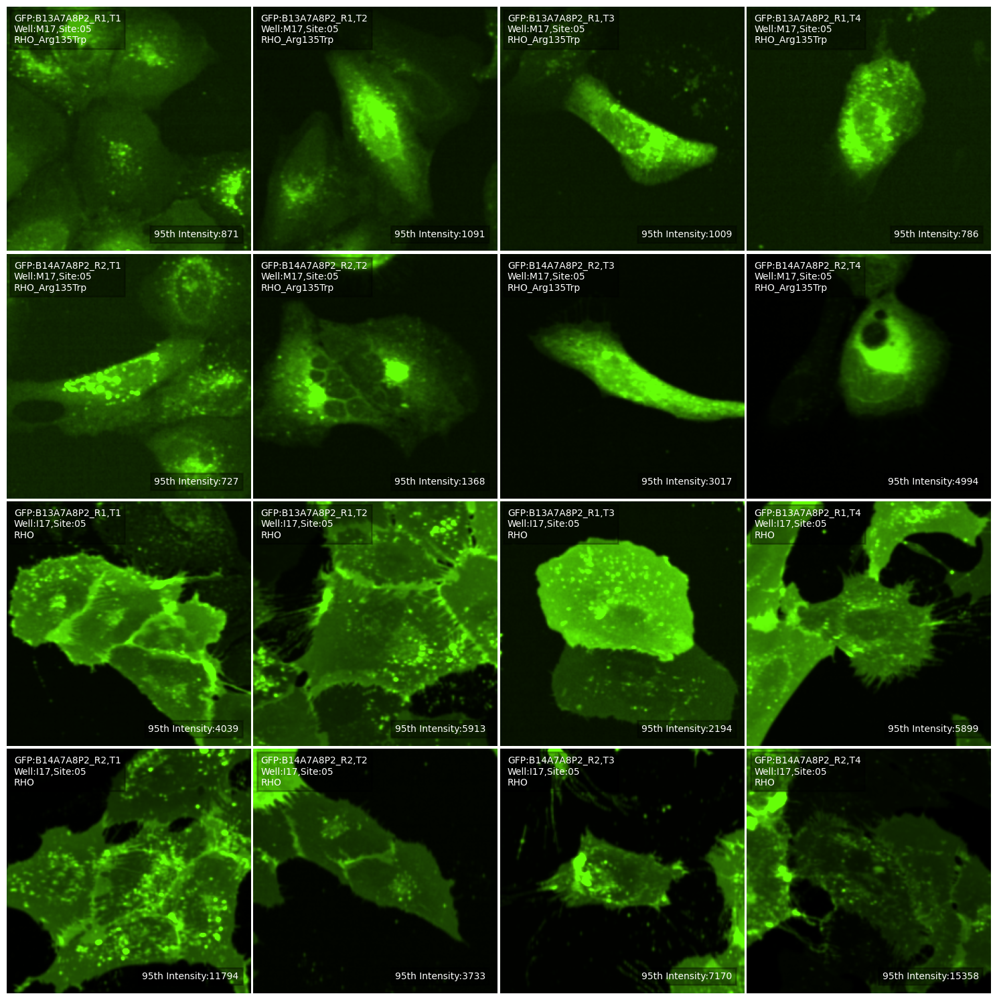

In [14]:
plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "RHO_Cys110Tyr", "GFP", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)

plot_allele_cell(allele_meta_dict["2025_01_27_Batch_13"].filter(pl.col("plate_map_name").str.contains("B13")), 
                 "RHO_Arg135Trp", "GFP", auroc_df=local_wtvar, #plate_img_qc=img_well_qc_sum, 
                 site="05", max_intensity=0.99, display=True, imgs_dir=TIFF_IMGS_DIR, output_dir=OUT_CELLS_DIR)